## DBScan Method

In [1]:
# load pandas to deal with the data
import pandas as pd
# plotting
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np

import plotly.express as px 

from sklearn.preprocessing import StandardScaler
# DBSCAN
from sklearn.cluster import DBSCAN

# k nearest neighburs 
from sklearn.neighbors import NearestNeighbors

from sklearn.metrics import silhouette_score, silhouette_samples

import folium

import nltk

In [2]:
datadb = pd.read_table("./data/cleaned-data.csv", sep=",")

In [4]:
# we will keep only the lat and long columns for clustering
columns_to_drop = ['id', 'user', 'tags', 'title',  'date_taken_minute', 'date_taken_hour', 'date_taken_day', 'date_taken_month', 'date_taken_year', 'date_upload_minute', 'date_upload_hour', 'date_upload_day', 'date_upload_month', 'date_upload_year', 'Unnamed: 16',	'Unnamed: 17',	'Unnamed: 18']
df_clustering = datadb.drop(columns_to_drop , axis=1)

In [5]:
# Scale the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_clustering)
# show
#print(scaled_data)
# create a DataFrame
scaled_data_df = pd.DataFrame(data=scaled_data, columns=df_clustering.columns)
#scaled_data_df.head()

In [7]:
min_pnts = 4

def find_optimal_eps(data, min_pts):
    # Calculate distances to k-nearest neighbors
    neigh = NearestNeighbors(n_neighbors=min_pts)
    neigh.fit(data)
    distances, _ = neigh.kneighbors(data)
    
    
    # Sort distances to kth neighbor in ascending order
    k_distances = np.sort(distances[:, min_pts-1])
    
    # Create plot
    fig = px.line(
        x=range(len(k_distances)),
        y=k_distances,
        title=f'K-distance Graph (k={min_pts})',
        labels={'x': 'Points sorted by distance', 
                'y': f'Distance to {min_pts}th nearest neighbor'}
    )
    
    return fig

In [8]:
fig = find_optimal_eps(scaled_data, min_pnts)
fig.show() # display the plot

In [9]:
# ANSWER
best_eps = 0.13
best_min_samples = 4
# Apply DBSCAN with best parameters
best_dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels = best_dbscan.fit_predict(scaled_data)

In [10]:
datadb['cluster dbscan'] = best_labels
datadb['silhouette dbscan'] = silhouette_samples(scaled_data, best_labels, metric='euclidean')

In [11]:
# ANSWER
def plot_silhouette(sample_silhouette_values, silhouette_avg, labels, n_clusters=3):
    # Create the plot
    fig = plt.figure(figsize=(10, 6))
    
    y_lower = 10
    for i in range(n_clusters):
        # Get silhouette scores for cluster i
        ith_cluster_values = sample_silhouette_values[labels == i]
        ith_cluster_values.sort()
        
        size_cluster_i = ith_cluster_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Fill the silhouette
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                         0, ith_cluster_values,
                         alpha=0.7)
        
        # Label the silhouette plots
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, f'Cluster {i}')
        
        y_lower = y_upper + 10
    
    # Add vertical line for average silhouette score
    plt.axvline(x=silhouette_avg, color='red', linestyle='--', 
                label=f'Average Silhouette: {silhouette_avg:.3f}')
    
    plt.title('Silhouette Plot')
    plt.xlabel('Silhouette Coefficient')
    plt.ylabel('Cluster')
    plt.legend(loc='best')
    plt.tight_layout()
    
    return fig

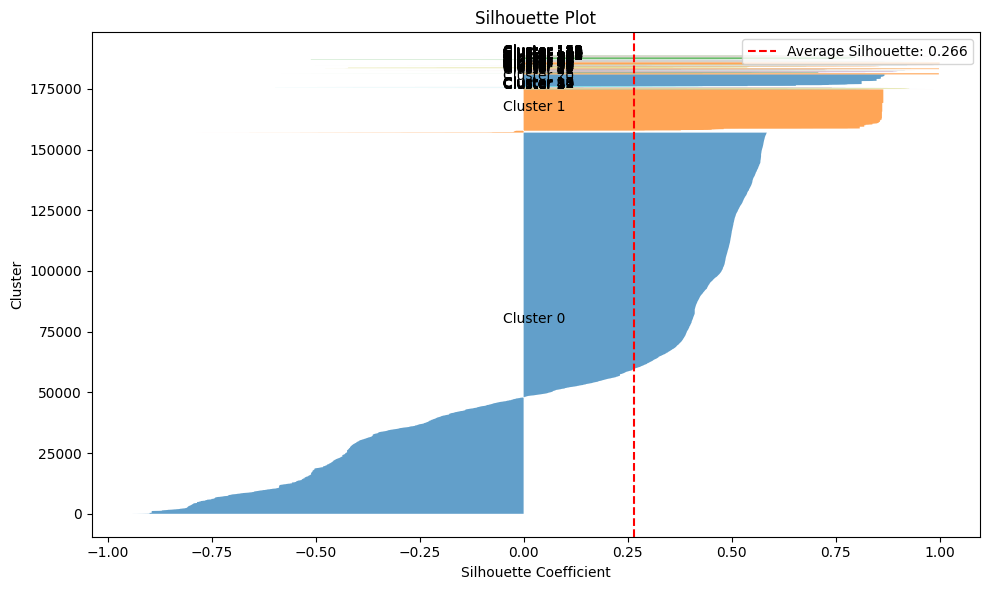

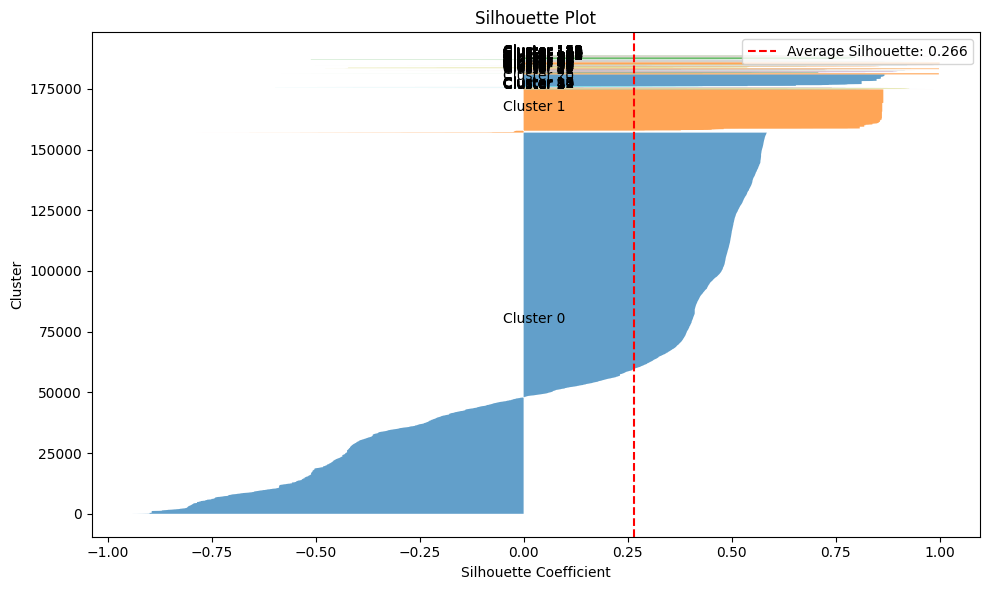

In [12]:
plot_silhouette(datadb['silhouette dbscan'].values, silhouette_score(scaled_data, best_labels, metric='euclidean'), best_labels, n_clusters=len(set(best_labels)) - (1 if -1 in best_labels else 0))

In [13]:
datadb.groupby('cluster dbscan')['silhouette dbscan'].mean()

cluster dbscan
-1     -0.919182
 0      0.169947
 1      0.794097
 2      0.715330
 3      0.973382
          ...   
 148    0.886891
 149    0.946594
 150    0.990039
 151    0.762304
 152    0.973951
Name: silhouette dbscan, Length: 154, dtype: float64

### Apply DBSCAN on the first two clusters

In [15]:
# filtering the cluster 0 and 1

filtered_data_dsbcan = datadb[(datadb['cluster dbscan'] == 0) | (datadb['cluster dbscan'] == 1)]

In [17]:
min_pnts = 4
df_clustering_filtered = filtered_data_dsbcan.drop(columns_to_drop , axis=1)
# Scale the data
scaler = StandardScaler()
scaled_data_filtered = scaler.fit_transform(df_clustering_filtered)
# show
#print(scaled_data_filtered)


In [18]:
# ANSWER
fig = find_optimal_eps(scaled_data_filtered, min_pnts)
fig.show() # display the plot

In [19]:
# ANSWER
best_eps = 0.02
best_min_samples = 4
# Apply DBSCAN with best parameters
best_dbscan_filtered = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels_filtered = best_dbscan_filtered.fit_predict(scaled_data_filtered)

In [20]:
filtered_data_dsbcan['cluster dbscan'] = best_labels_filtered
filtered_data_dsbcan['silhouette dbscan'] = silhouette_samples(scaled_data_filtered, best_labels_filtered, metric='euclidean')

C:\Users\bernardo\AppData\Local\Temp\ipykernel_4360\4203202314.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\bernardo\AppData\Local\Temp\ipykernel_4360\4203202314.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Ploting with DBScan

In [23]:
#Plotting with dbscan
datadb
datadb.groupby('cluster dbscan')[['lat', 'long']].mean()
# Create a folium map centered around the mean latitude and longitude of the clusters
map_clusters = folium.Map(location=[datadb['lat'].mean(), datadb['long'].mean()], zoom_start=12, control_scale=True)

# Add markers for each cluster center
for cluster_label, cluster_center in datadb.groupby('cluster dbscan')[['lat', 'long']].mean().iterrows():
    folium.Marker(
        location=[cluster_center['lat'], cluster_center['long']],
        popup=f'Cluster {cluster_label}',
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(map_clusters)

map_clusters

In [24]:
#Plotting with dbscan filtered cluster center
filtered_data_dsbcan
filtered_data_dsbcan.groupby('cluster dbscan')[['lat', 'long']].mean()
# Create a folium map centered around the mean latitude and longitude of the clusters
map_clusters = folium.Map(location=[filtered_data_dsbcan['lat'].mean(), filtered_data_dsbcan['long'].mean()], zoom_start=12, control_scale=True)

# Add markers for each cluster center
for cluster_label, cluster_center in filtered_data_dsbcan.groupby('cluster dbscan')[['lat', 'long']].mean().iterrows():
    folium.Marker(
        location=[cluster_center['lat'], cluster_center['long']],
        popup=f'Cluster {cluster_label}',
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(map_clusters)

map_clusters